## Notebook to examine the inductive bias of simple cerebellar-type networks

We generate the plots that show the kernel eigenfunctions of a simple cerebellar-network model that studies the role on structured connectivity.

In [1]:
import numpy as np
import random
import matplotlib.pyplot as plt
#plt.style.use('dark_background')
import scipy as sc

In [2]:
# Set up some parameters
K = 300 # Number of hidden neurons
N = 1000 # Number of datapoints to use

# Plotting 
rows = 4
columns = 4

In [3]:
# Define some helpful functions

# Function to sample N new data samples
def new_data(Num):
    x = np.random.normal(0,1,[Num,3])
    return x/np.linalg.norm(x, axis = 1)[:,np.newaxis]

# Code for plotting all points on sphere onto a plane, to avoid matplotlibs horrendous 3D plots
def threeto2D(x):
    y = np.zeros([x.shape[0], 2])
    y[:,0] = np.arctan2(x[:,1],x[:,0])
    y[:,1] = np.arctan2(x[:,2],np.sqrt(np.power(x[:,0],2) + np.power(x[:,1],2)))
    return y

def plotter(rows, columns, eigenvectors, eigenvalues, x, points = np.array([]), colours = {}):
    y_two = threeto2D(x)
    plt.figure(figsize = (12,8))
    for ploty in range(rows*columns):
        # Normalise the scale
        coloring = np.real(eigenvectors[:,ploty])
        size = np.max(np.abs(coloring))
        if np.max(coloring) < 0:
            size = -1*size
        coloring = coloring/size
        
        plt.subplot(rows, columns, ploty+1)
        plt.scatter(y_two[:,0], y_two[:,1], c = coloring, s = 15)
        #plt.colorbar()
        plt.title(f'eigenvalue {ploty}: {np.real(eigenvalues[ploty]):.3f}')
        plt.clim([-1,1])
        frame1 = plt.gca()
        frame1.axes.get_xaxis().set_visible(False)
        frame1.axes.get_yaxis().set_visible(False)
        
        if np.size(points) != 0:
            for (i, colour) in enumerate(colours):
                plt.scatter(points[i, 0], points[i, 1], s = 60, c = colour)

In [4]:
# Define two possible non-linearities

# Simple ReLU
def ReLU(x, J):
    y = np.matmul(x,J) - 0
    return y*(y>0)

# A nonlinearity that sparsifies the representation
def phi(x, S, J):
    y = x@J
    K, N = y.shape
    for datapoint in range(K):
        thresh = np.sort(np.ndarray.flatten(y[datapoint,:]))[int(-S*N)]
        y[datapoint,:] = y[datapoint,:] - thresh
        y[datapoint,:] = y[datapoint,:]*(y[datapoint,:]>0)
        #y[:,neuron] = y[:,neuron]/np.linalg.norm(y[:,neuron])
    return y

# Most-Analytic Example
We begin by studying a simple analytic kernel! Assumes things like infinitely many neurons, but ah well ;)

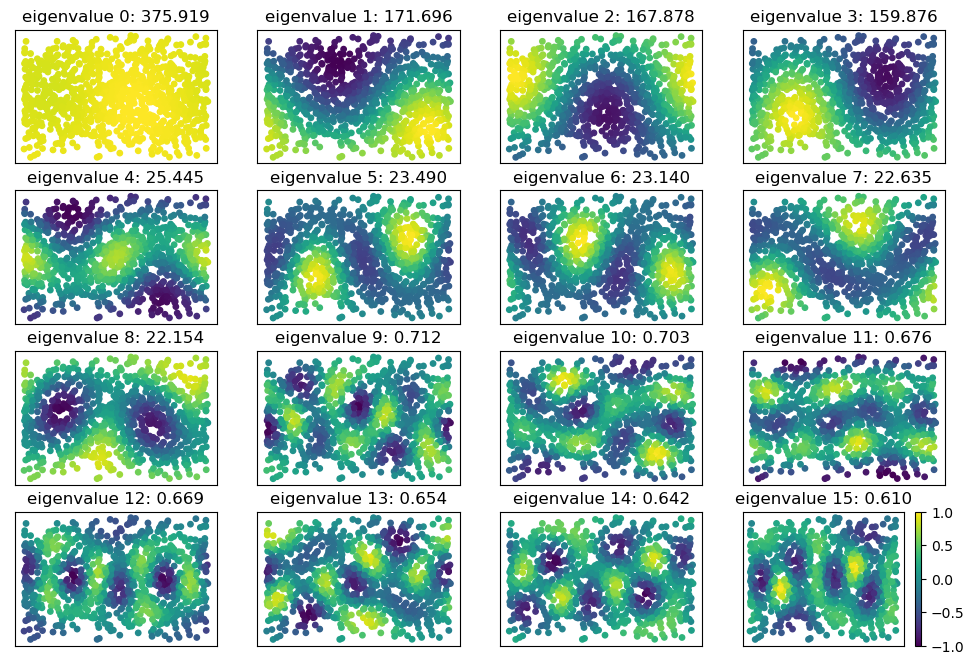

In [5]:
# Generate data, and create the kernel
x = new_data(N)
theta = np.arccos(np.maximum(-np.ones([N,N]), np.minimum(np.ones([N,N]), np.matmul(x, x.T))))
kernel_matrix = 1/np.pi*(np.sin(theta) + (np.pi-theta)*np.cos(theta))

# Calculate kernel matrix and its eigs
w, v = np.linalg.eig(kernel_matrix)

# Plot these kernel eigevectors
plotter(rows, columns, v, w, x)
plt.colorbar()

Up next, we do the same for biased connectivity

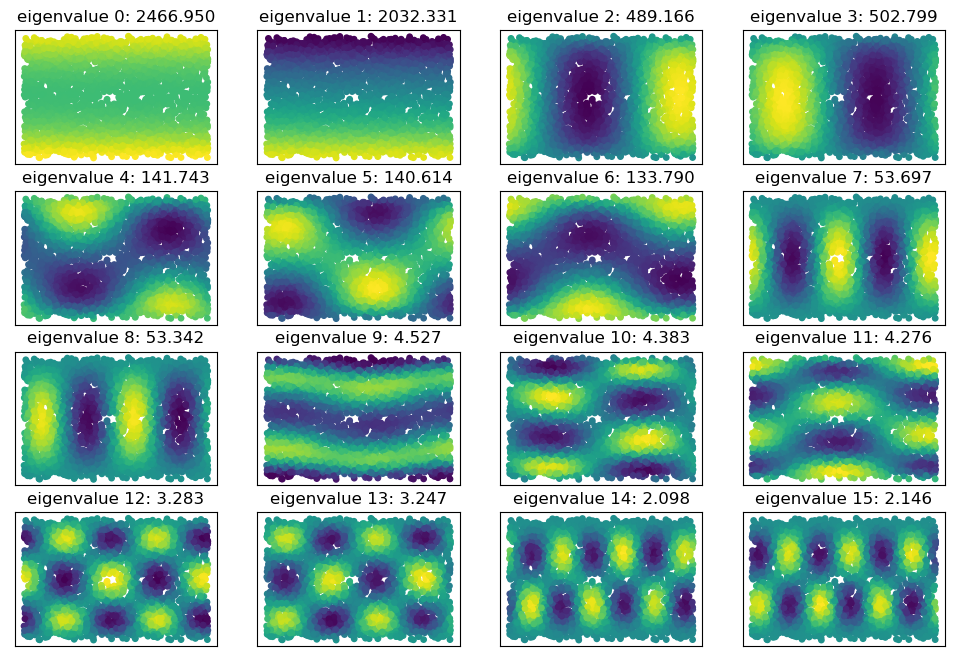

In [10]:
# Generate data, and create the kernel
x = new_data(N)
Sigma_sq_rt = np.array([[1,0,0],[0,1,0],[0,0,2]])
x = np.matmul(x, Sigma_sq_rt)
x_norms = np.linalg.norm(x, axis = 1)
x_normed = x/x_norms[:,None]
theta = np.arccos(np.maximum(-np.ones([N,N]), np.minimum(np.ones([N,N]), np.matmul(x_normed, x_normed.T))))
kernel_matrix = np.multiply(np.outer(x_norms, x_norms), 1/np.pi*(np.sin(theta) + (np.pi-theta)*np.cos(theta)))

# Calculate kernel matrix and its eigs
w, v = np.linalg.eig(kernel_matrix)

# Plot these kernel eigevectors
plotter(rows, columns, v, w, x)

Finally, let's do grouped connectivity

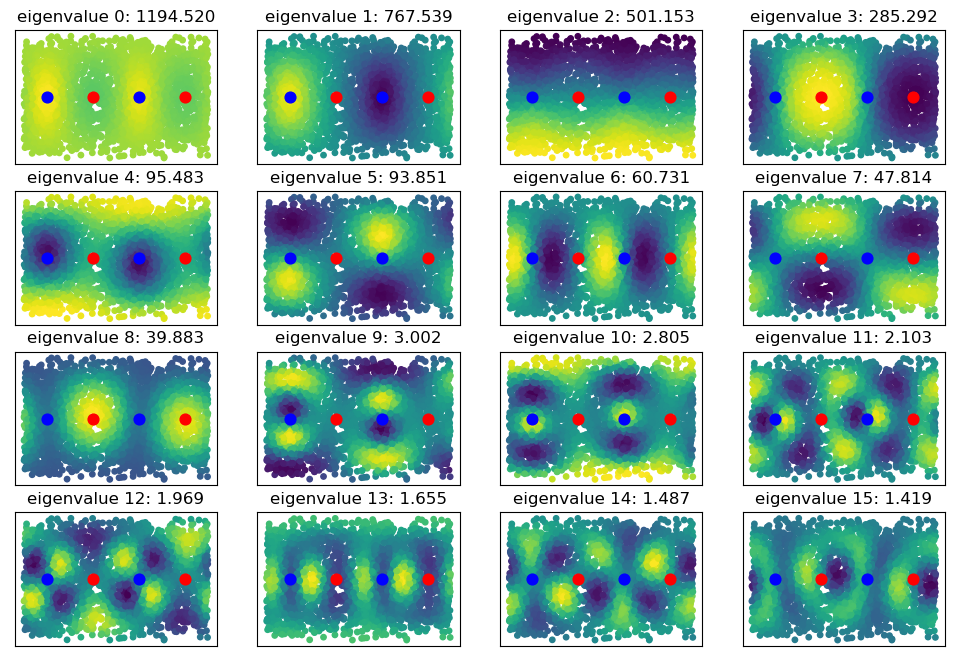

In [110]:
# Generate data, and create the kernel
x = new_data(N)
Sigma_sq_rt = np.array([[1,0.25,0],[0.25,1,0],[0,0,1]])
x = np.matmul(x, Sigma_sq_rt)
x_norms = np.linalg.norm(x, axis = 1)
x_normed = x/x_norms[:,None]
theta = np.arccos(np.maximum(-np.ones([N,N]), np.minimum(np.ones([N,N]), np.matmul(x_normed, x_normed.T))))
kernel_matrix = np.multiply(np.outer(x_norms, x_norms), 1/np.pi*(np.sin(theta) + (np.pi-theta)*np.cos(theta)))

# Calculate kernel matrix and its eigs
w, v = np.linalg.eig(kernel_matrix)

# Plot these kernel eigevectors
plotter(rows, columns, v, w, x, points = np.array([[np.pi/4, 0], [-3*np.pi/4,0], [3*np.pi/4, 0], [-np.pi/4, 0]]), colours = ['blue', 'blue', 'red', 'red'])

# Pseudo-Analytic Example
We then study a simple (less biological) example with ReLU non-linearities and positive or negative weights sampled from some normal.

In [112]:
# Begin with the completely random example
J = np.random.multivariate_normal(np.zeros(3), np.eye(3), size = K).T

# Push randomly sampled data through ReLU
x = new_data(N)
y = ReLU(x, J)

# Calculate kernel matrix and its eigs
kernel_matrix = np.matmul(y, np.transpose(y))/N
w, v = np.linalg.eig(kernel_matrix)

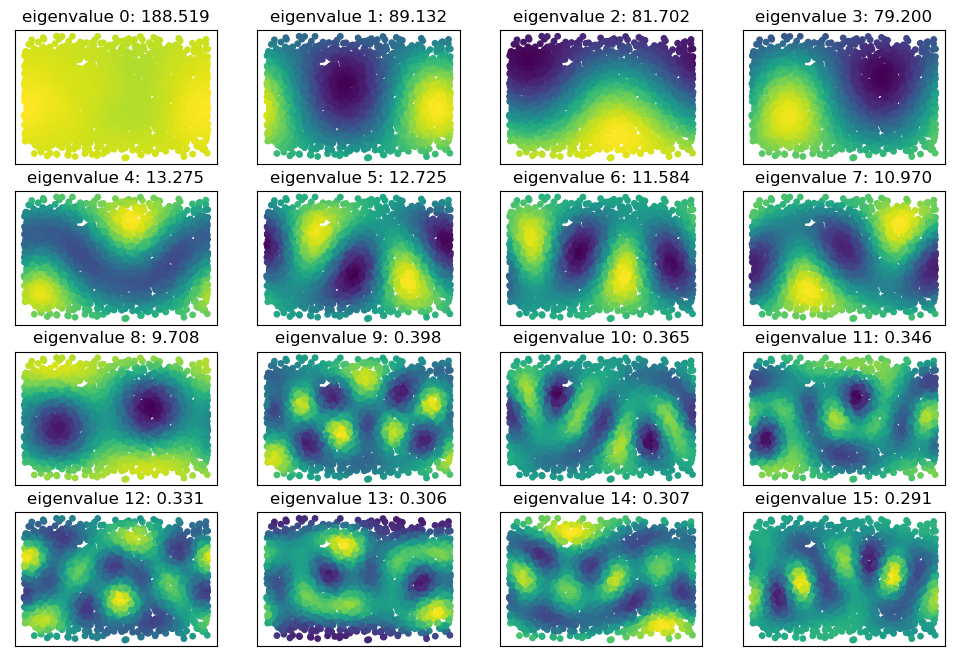

In [113]:
# Plot these kernel eigevectors
plotter(rows, columns, v, w, x)

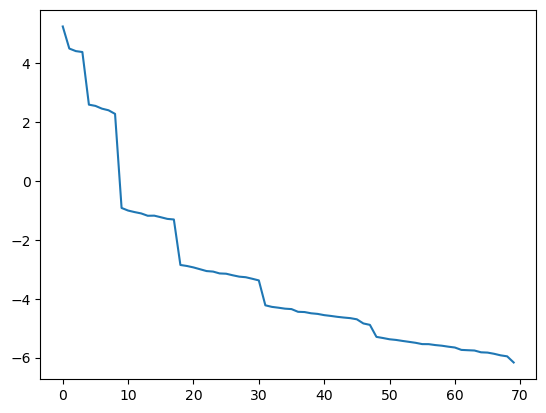

In [114]:
# Show the plateaus of the eigenvalues, from the spherical harmonic structure
plt.plot(np.log(np.real(w[0:70])))

So, completely random network produces a smoothness bias, as expected.

What happens when we include an overconnection to the z neuron in the weight connectivity?

In [158]:
# Overconnect in the z direction by a factor c
c = 2
cov = [[1, 0, 0], [0, 1, 0], [0, 0, c]]
J = np.random.multivariate_normal(np.zeros(3), cov, size = K).T

# Push randomly sampled data through ReLU
x = new_data(N)
y = ReLU(x, J)

# Calculate kernel matrix and its eigs
kernel_matrix = np.matmul(y, np.transpose(y))/N
w, v = np.linalg.eig(kernel_matrix)

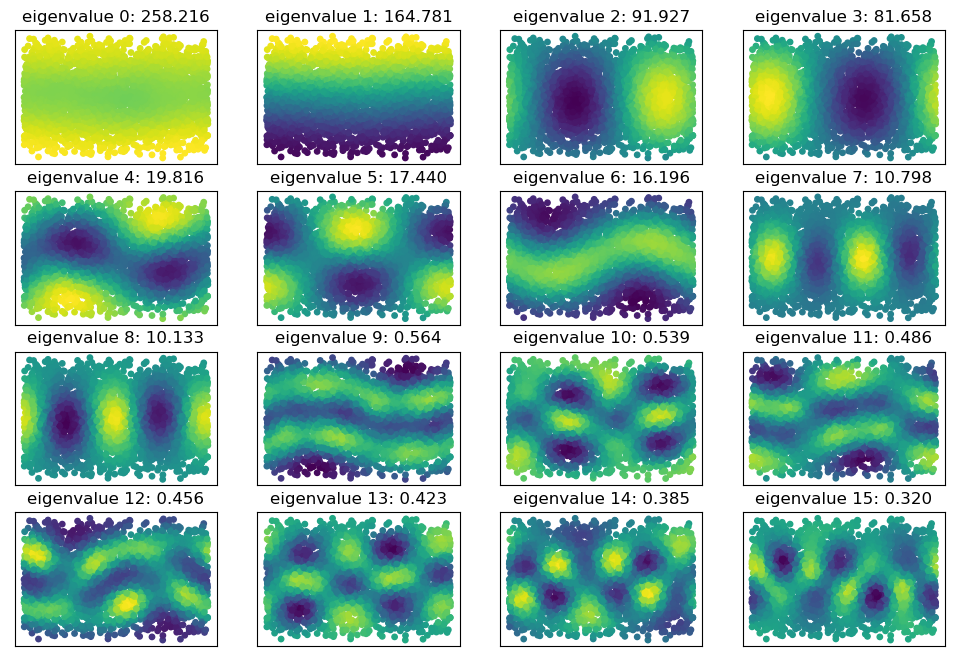

In [116]:
# Plot these kernel eigevectors
plotter(rows, columns, v, w, x)

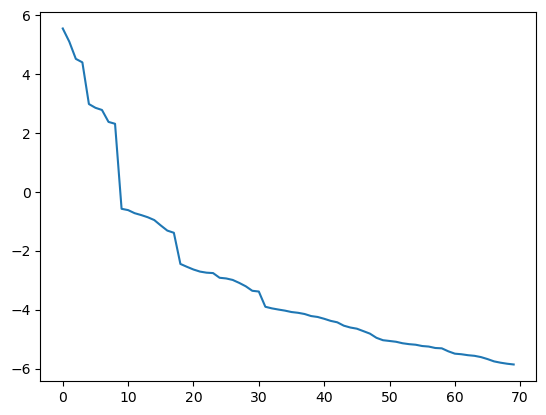

In [117]:
# Slightly different plateaus emerge
plt.plot(np.log(np.real(w[0:70])))

Great, so leads to that neuron's activity being far more important.

What about correlations in the connectivity?

In [118]:
# Correlate x and y directions by a factor c
c = 0.5
cov = [[1, c, 0], [c, 1, 0], [0, 0, 1]]
J = np.random.multivariate_normal(np.zeros(3), cov, size = K).T

# Push randomly sampled data through ReLU
x = new_data(N)
y = ReLU(x, J)

# Calculate kernel matrix and its eigs
kernel_matrix = np.matmul(y, np.transpose(y))/N
w, v = np.linalg.eig(kernel_matrix)

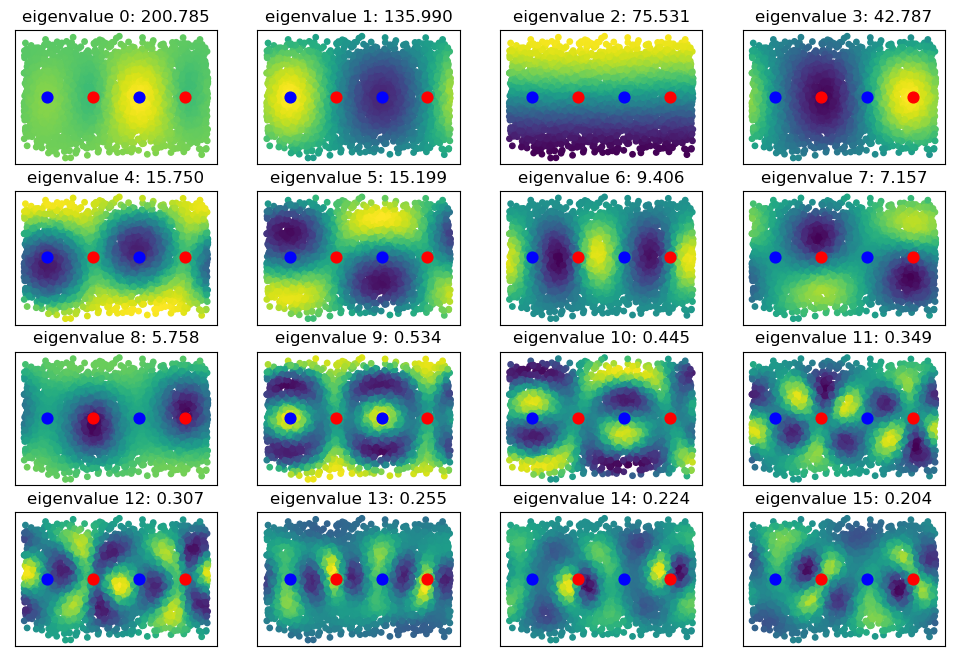

In [119]:
# Plot these kernel eigevectors
plotter(rows, columns, v, w, x, points = np.array([[np.pi/4, 0], [-3*np.pi/4,0], [3*np.pi/4, 0], [-np.pi/4, 0]]), colours = ['blue', 'blue', 'red', 'red'])

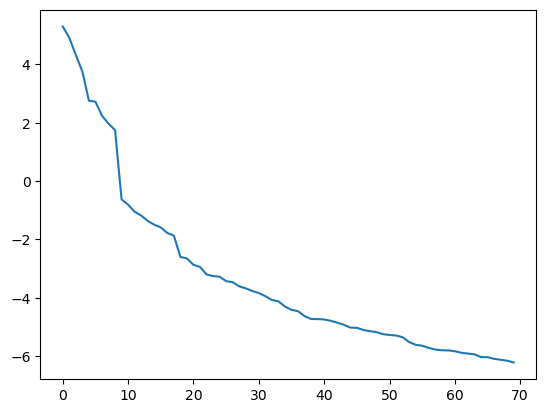

In [120]:
# Slightly different plateaus emerge
plt.plot(np.log(np.real(w[0:70])))

## Slightly More Biological Kernel Eigenfunctions

Now we reintroduce some biological features, sparsity in the hidden layer, sparsity in the connectivity, and positive only weights, and show we get the same effects (though less analytic intuition)

In [519]:
def generate_sparsifier(learner_params):
    if "p" in learner_params:
        sparsifier = np.array([np.delete(np.arange(0, input_size_gen), np.random.choice(input_size_gen, learner_params["sparsity"],  p=learner_params["p"], replace=False)) for i in range(learner_params["K"])])
    elif "p1" in learner_params:
        connected = np.zeros([learner_params["K"], learner_params["sparsity"]])
        sparsifier = np.zeros([learner_params["K"], input_size_gen - learner_params["sparsity"]])
        for neuron in range(learner_params["K"]):
            connected[neuron, 0] = np.random.choice(input_size_gen, 1, p = learner_params["p1"])
            if connected[neuron, 0] < 2:
                connected[neuron, 1] = np.random.choice(np.delete(np.arange(0, input_size_gen), int(connected[neuron, 0])), 1, p = learner_params["p2G"])
            else:
                connected[neuron, 1] = np.random.choice(np.delete(np.arange(0, input_size_gen), int(connected[neuron, 0])), 1, p = learner_params["p2N"])
        sparsifier = np.array([np.delete(np.arange(0, input_size_gen), connected[neuron, :].astype(int)) for neuron in range(learner_params["K"])])
    else:
        sparsifier = np.array([np.delete(np.arange(0, input_size_gen), np.random.choice(input_size_gen, learner_params["sparsity"], replace=False)) for i in range(learner_params["K"])])
    return sparsifier

def generate_data(N, D):
    x = np.random.normal(0, 1, [N, D])
    x = x/np.linalg.norm(x, axis = 1)[:,np.newaxis]
    x = np.hstack([x, np.ones([N,1])])
    return x
    
# Meta-learner parameterse
input_size_gen = 5 # Input dimensionality
output_size_gen = 1

# Learner parameters
learner_params = {"K": 150, # Hidden layer size
                  "sparsity": 2, # Number of connections per hidden layer neuron
                  "activity_sparsity": 0.2,
                 "positivity": 1, # Should all the first layer connection weights be positive?
                  "connectivity_scheme": 0} # Connectivity scheme, 0 for random 2-sparse, 1 for over-connected, 2 for grouped. 
        
# Connectivity schemes 1 and 2 are only coded up for 4 or 5 input neurons.
if learner_params["connectivity_scheme"] == 1:
    if input_size_gen == 5:
        learner_params["p"] = [0.6, 0.1, 0.1, 0.1, 0.1]
    elif input_size_gen == 4:
        learner_params["p"] = [0.7, 0.1, 0.1, 0.1]
elif learner_params["connectivity_scheme"] == 2:
    if input_size_gen == 5:
        learner_params["p1"] = [0.2, 0.2, 0.2, 0.2, 0.2]
        learner_params["p2G"] = [0.85, 0.05, 0.05, 0.05]
        learner_params["p2N"] = [0.1, 0.1, 0.4, 0.4]
    elif input_size_gen == 4:
        learner_params["p1"] = [0.25, 0.25, 0.25, 0.25]
        learner_params["p2G"] = [0.45, 0.45, 0.1]
        learner_params["p2N"] = [0.33, 0.33, 0.34]

learner_params["rand_sparse"] = generate_sparsifier(learner_params)

In [520]:
[print(len(np.where(learner_params["rand_sparse"] == i)[0])) for i in range(5)]

83
95
94
89
89


[None, None, None, None, None]

In [529]:
x = generate_data(2000, input_size_gen)
if learner_params['positivity']:
    J_vals = np.abs(np.random.normal(0, 1, learner_params["rand_sparse"].size))
else:
    J_vals = np.random.normal(0, 1, learner_params["rand_sparse"].size)

J = np.zeros([learner_params['K'], input_size_gen+1]) 
counter = 0
for row_ind, row in enumerate(learner_params["rand_sparse"]):
    J[row_ind, row] = J_vals[counter:counter + row.size]
    counter += row.size
J[:,-1] = np.random.uniform(0.5, 1, [learner_params['K']])

y = phi(x, learner_params['activity_sparsity'], J.T)

# Calculate kernel matrix and its eigs
kernel_matrix = np.matmul(y, np.transpose(y))/N
w, v = np.linalg.eig(kernel_matrix)

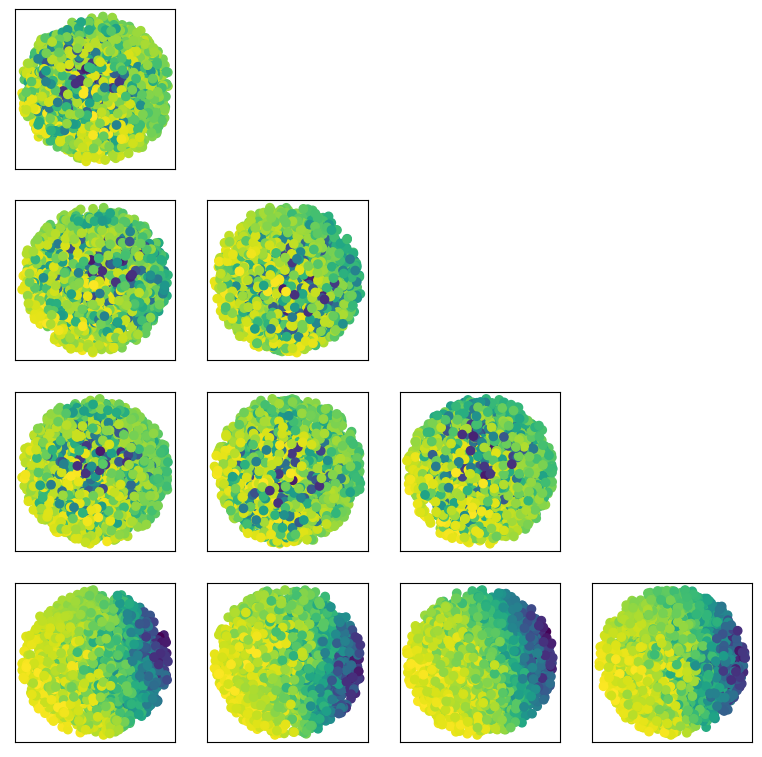

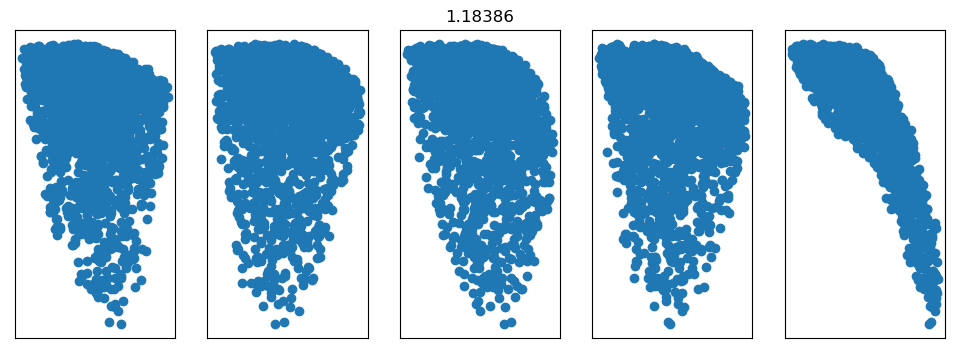

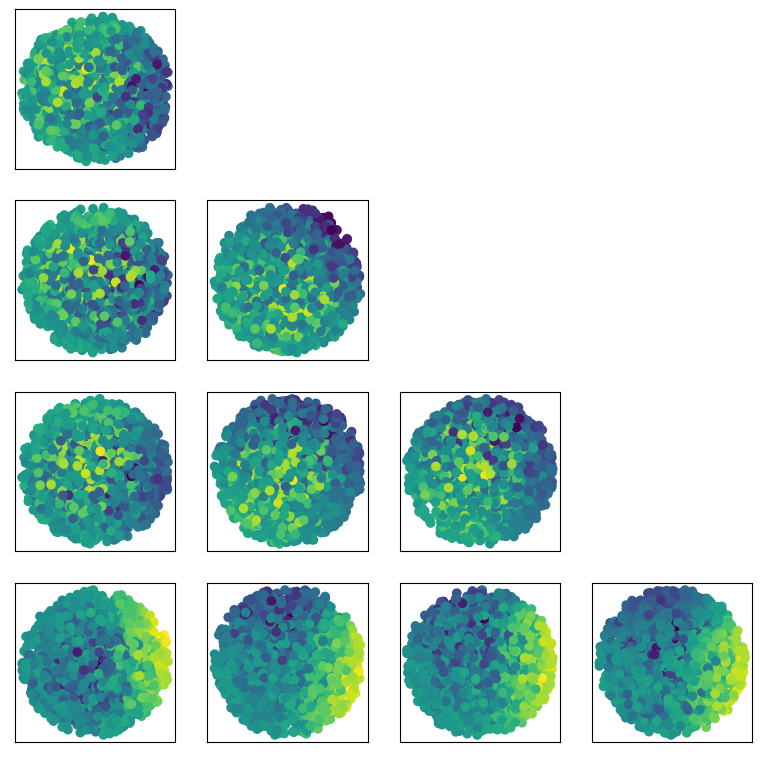

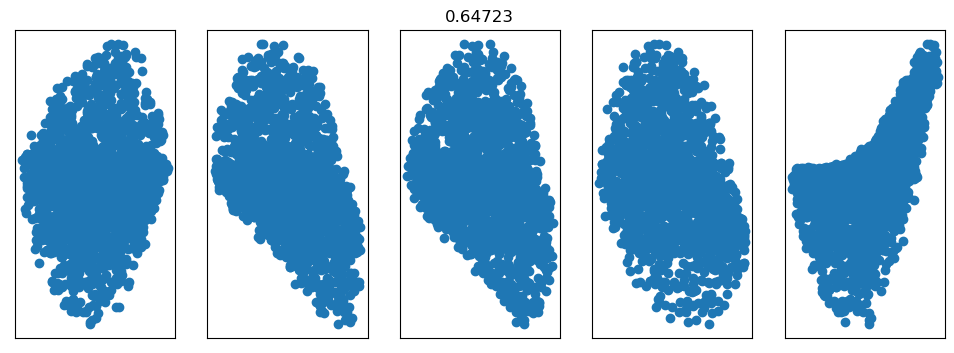

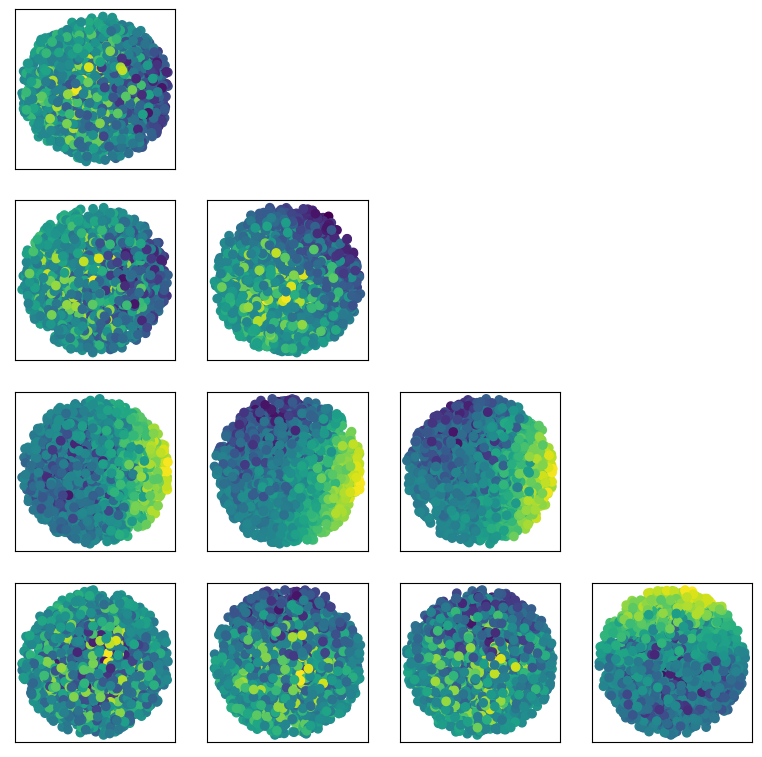

...

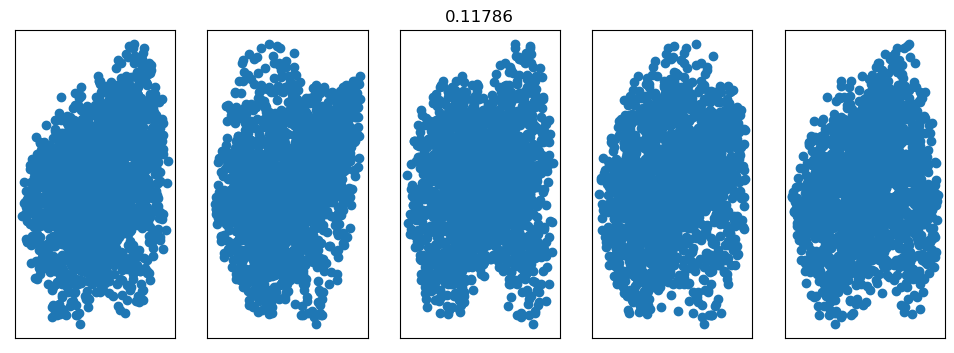

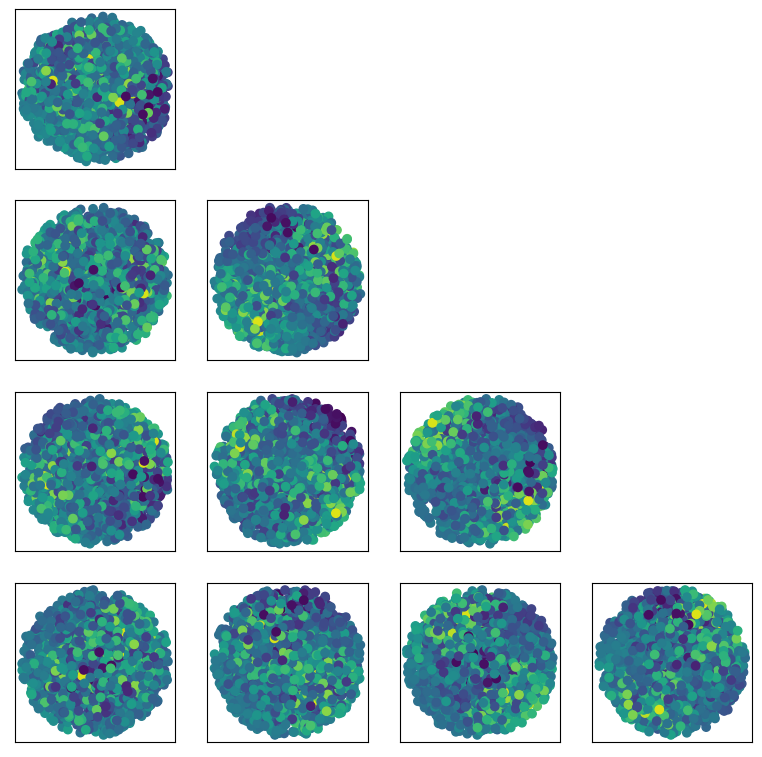

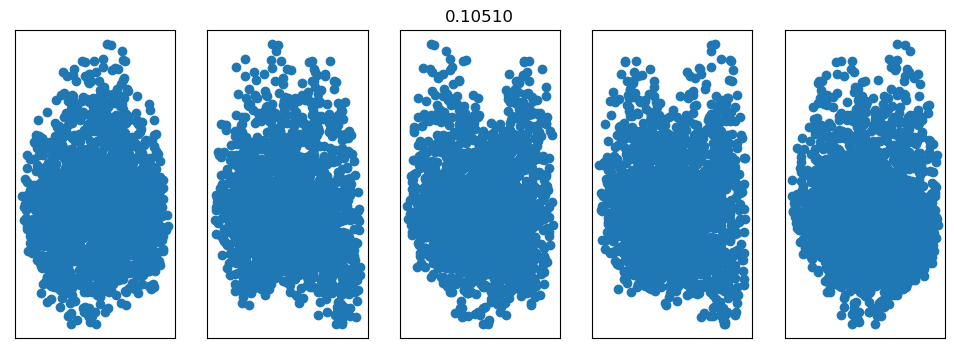

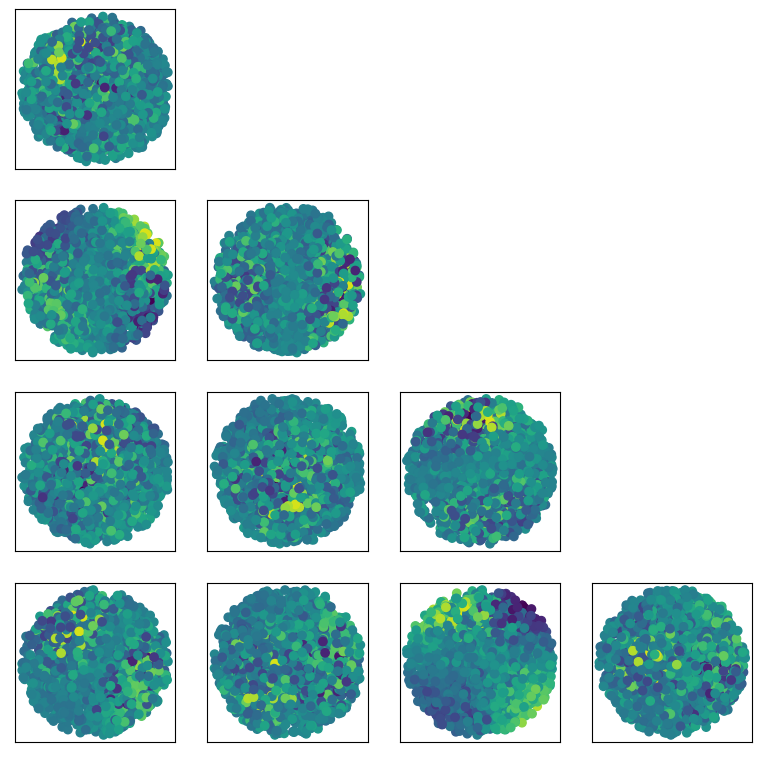

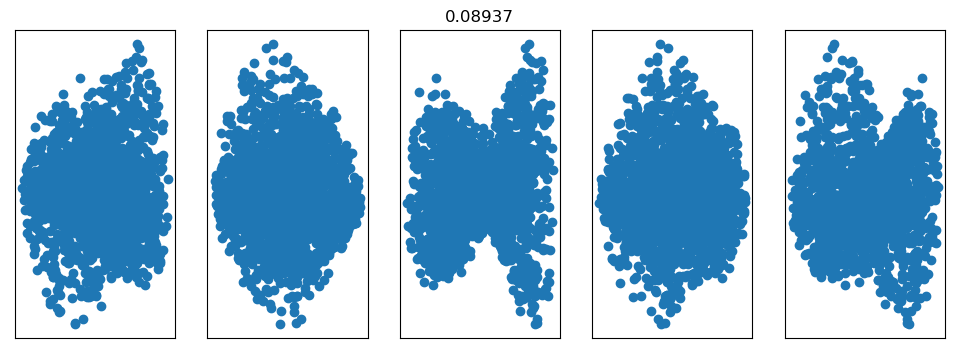

In [530]:
# Let's have a look at a lot of datapoints then
#plt.rcParams['axes.linewidth'] = 5 #set the value globally

for eig in range(10):

    # Can we get any insight?
    plt.figure(figsize = (12, 12))
    for ind_1 in range(input_size_gen):
        for ind_2 in range(ind_1):
            plt.subplot(input_size_gen, input_size_gen, ind_1*input_size_gen + 1 + ind_2)
            plt.scatter(x[:,ind_1], x[:,ind_2], c = v[:,eig])
            frame = plt.gca()
            frame.axes.get_xaxis().set_visible(False)
            frame.axes.get_yaxis().set_visible(False)
    
    plt.figure(figsize = (12, 4))
    for ind_1 in range(input_size_gen):
        plt.subplot(1, input_size_gen, ind_1 + 1)
        plt.scatter(x[:,ind_1], v[:,eig])
        frame = plt.gca()
        frame.axes.get_xaxis().set_visible(False)
        frame.axes.get_yaxis().set_visible(False)
        if ind_1 == 2:
            plt.title(f'{np.real(w[eig]):.5f}')


# Old Code

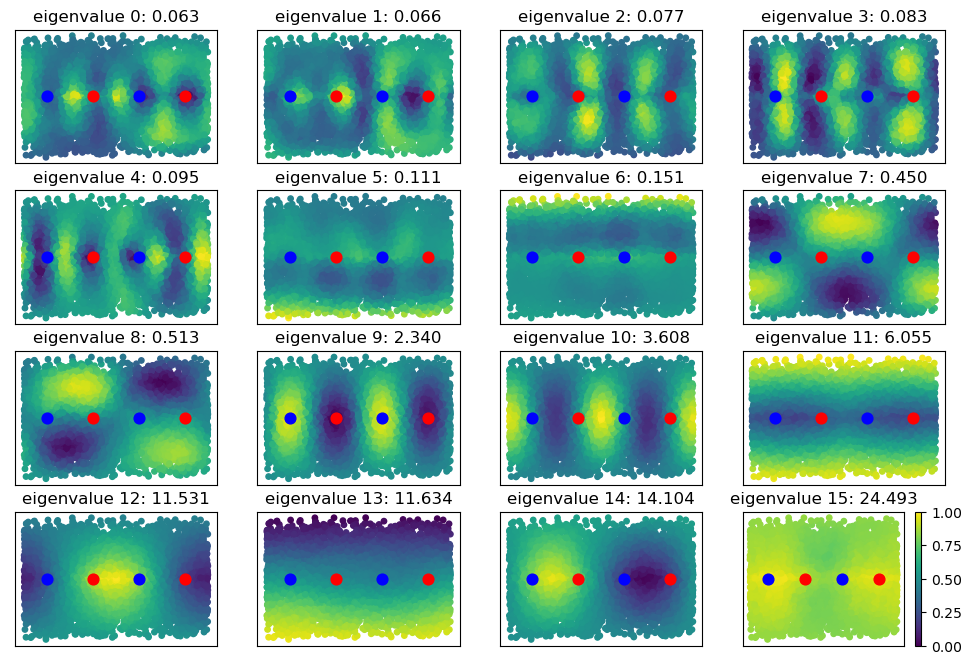

In [651]:
# Generate data, and create the kernel
N = 5000
pos_data = 0
pos_weights = 0
K = 1500
S = 0.1
S_J = 0.15
connectivity_scheme = 2
Z_connectivity_prob = 0.4
Grouped_connectivity = 0.9 # If connected to one prob of connected to other

x = new_data(N)
if pos_data:
    x = np.abs(x)

#x = np.vstack([x, np.array([1,0,0]), np.array([0,1,0]), np.array([0,0,1])])

J = np.random.multivariate_normal(np.zeros(3), np.eye(3), size = K).T
if pos_weights:
    J = np.abs(J)

if connectivity_scheme == 0:
    sparsity_mask = np.random.uniform(0, 1, J.shape) < S_J
elif connectivity_scheme == 1:
    sparsity_mask_xy = np.random.uniform(0, 1, [2,K]) < S_J
    sparsity_mask_z = np.random.uniform(0, 1, [1,K]) < Z_connectivity_prob
    sparsity_mask = np.vstack([sparsity_mask_xy, sparsity_mask_z])
elif connectivity_scheme == 2:
    sparsity_mask_yz = np.random.uniform(0, 1, [2,K]) < S_J
    y_connections = np.where(sparsity_mask_yz[0,:])[0]
    num_y_connections = len(y_connections)
    group_xy_connections = np.random.uniform(0, 1, [num_y_connections]) < Grouped_connectivity
    sparsity_mask_x = np.zeros([K])
    sparsity_mask_x[y_connections[group_xy_connections]] = True
    sparsity_mask_x += np.random.uniform(0, 1, [K]) < S_J*(1-Grouped_connectivity)
    sparsity_mask = np.vstack([sparsity_mask_x, sparsity_mask_yz])
    sparsity_mask[sparsity_mask > 1] = 1

J = np.multiply(J, sparsity_mask)
y = phi(x, S, J)

# Calculate kernel matrix and its eigs
kernel_matrix = np.matmul(y, np.transpose(y))/N
k = 16
w, v = sc.linalg.eigh(kernel_matrix, eigvals=(N-k,N-1))

# Plot these kernel eigevectors
if False:
    plotter(rows, columns, v, w, x)
else:
    plotter(rows, columns, v, w, x, points = np.array([[np.pi/4, 0], [-3*np.pi/4,0], [3*np.pi/4, 0], [-np.pi/4, 0]]), colours = ['blue', 'blue', 'red', 'red'])
plt.colorbar()

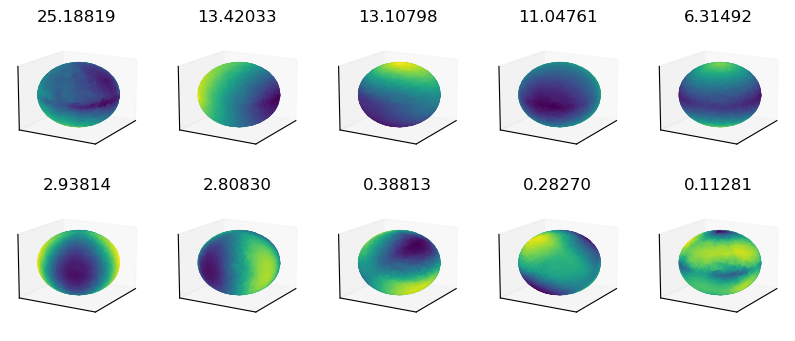

In [650]:
fig = plt.figure(figsize = (10, 4))
counter = 1
for eig in range(10):
    ax = fig.add_subplot(2, 5, counter, projection='3d')
    ax.scatter(x[:,0], x[:,1], x[:,2], c=v[:,-(eig+1)], alpha = 0.5)
    counter += 1
    plt.title(f'{np.real(w[-(eig+1)]):.5f}')
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_zticks([])
    ax.view_init(elev=15, azim=30)

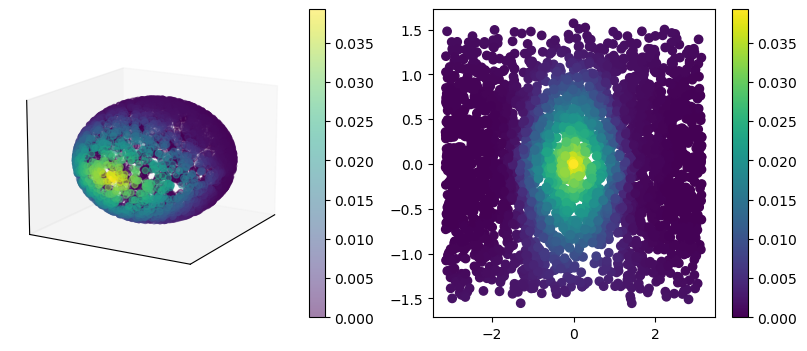

In [615]:
data_point = -3
fig = plt.figure(figsize = (10, 4))
ax = fig.add_subplot(1, 2, 1, projection='3d')
sc = ax.scatter(x[:,0], x[:,1], x[:,2], c=kernel_matrix[data_point,:], alpha = 0.5)

ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])
fig.colorbar(sc, orientation='vertical')
ax.view_init(elev=15, azim=30)

x_2D = threeto2D(x)
plt.subplot(1,2,2)
plt.scatter(x_2D[:,0], x_2D[:,1], c = kernel_matrix[data_point,:])
plt.colorbar()

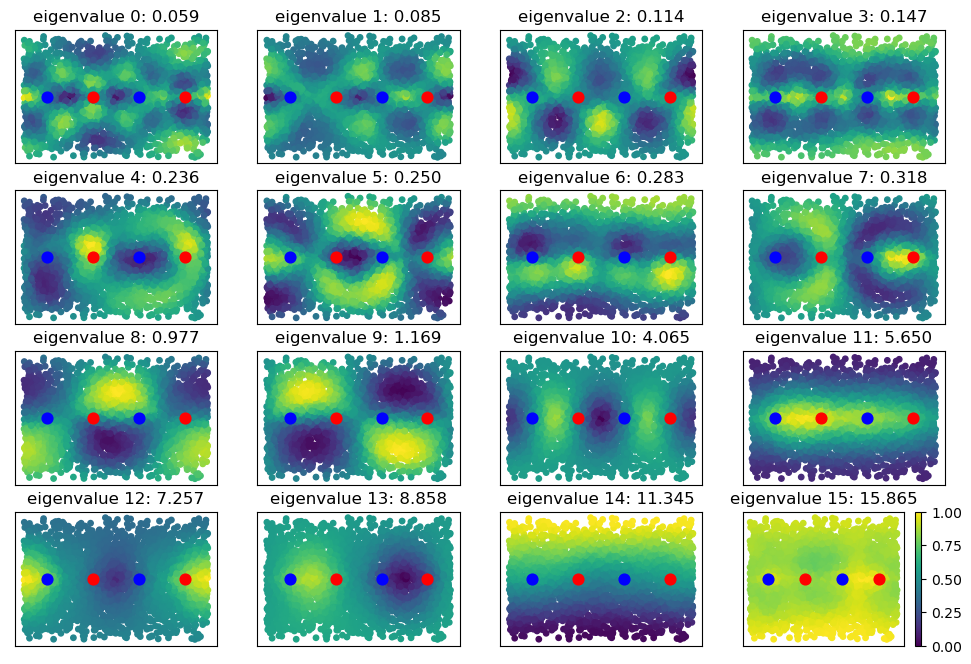

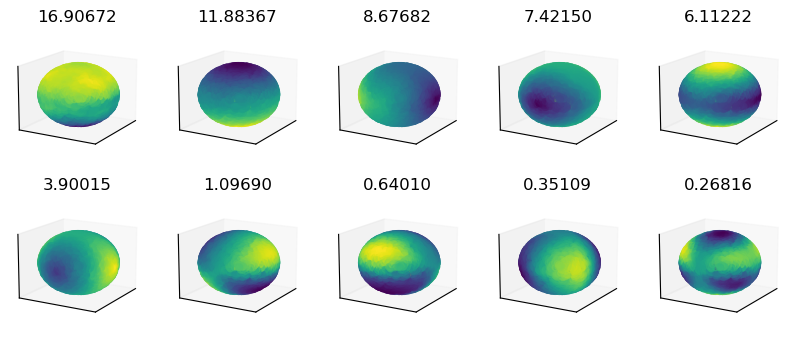

In [369]:
np.sum(sparsity_mask, axis = 1)

array([ 89,  92, 299])

In [435]:
# 
N = 2000
D = 5
K = 1500
S = 0.1
S_J = 0.15
connectivity_scheme = 1
Z_connectivity_prob = 0.75
Grouped_connectivity = 0.9 # If connected to one prob of connected to other

x = np.random.uniform(0, 1, [N, D])
x = x/np.linalg.norm(x, axis = 1)[:,None]
J = np.abs(np.random.multivariate_normal(np.zeros(D), np.eye(D), size = K).T)

if connectivity_scheme == 0:
    sparsity_mask = np.random.uniform(0, 1, J.shape) < S_J
elif connectivity_scheme == 1:
    #S_J = S_J/2
    sparsity_mask_xy = np.random.uniform(0, 1, [D-1,K]) < S_J
    sparsity_mask_z = np.random.uniform(0, 1, [1,K]) < Z_connectivity_prob
    sparsity_mask = np.vstack([sparsity_mask_xy, sparsity_mask_z])
elif connectivity_scheme == 2:
    sparsity_mask_yz = np.random.uniform(0, 1, [2,K]) < S_J
    y_connections = np.where(sparsity_mask_yz[0,:])[0]
    num_y_connections = len(y_connections)
    group_xy_connections = np.random.uniform(0, 1, [num_y_connections]) < Grouped_connectivity
    sparsity_mask_x = np.zeros([K])
    sparsity_mask_x[y_connections[group_xy_connections]] = True
    sparsity_mask_x += np.random.uniform(0, 1, [K]) < S_J*(1-Grouped_connectivity)
    sparsity_mask = np.vstack([sparsity_mask_x, sparsity_mask_yz])
    sparsity_mask[sparsity_mask > 1] = 1

J = np.multiply(J, sparsity_mask)

y = phi(x, S, J)

# Calculate kernel matrix and its eigs
kernel_matrix = np.matmul(y, np.transpose(y))/N
w, v = np.linalg.eig(kernel_matrix)

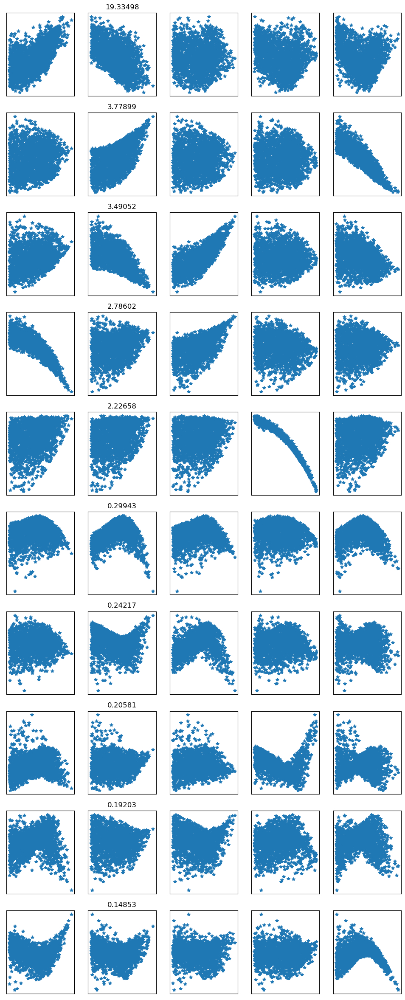

In [436]:
plt.figure(figsize = (12, 30))
for eig in range(10):
    for dim in range(D):
        plt.subplot(10, D, eig*D + dim + 1)
        plt.plot(x[:,dim], v[:,eig], '*')
        if dim == 1:
            plt.title(f'{np.real(w[eig]):.5f}')
        plt.xticks([])
        plt.yticks([])

In [ ]:
plt.figure(figsize = (12, 30))
for eig in range(10):
    counter = 1
    for dim in range(D):
        for dim1 in range(dim):
            plt.subplot(10, 3, eig*3 + counter)
            plt.scatter(x[:,dim], x[:,dim1], c = v[:,eig])
            plt.xlabel(dim)
            plt.ylabel(dim1)
            if counter == 2:
                plt.title(f'{np.real(w[eig]):.5f}')
            plt.xticks([])
            plt.yticks([])
            counter += 1
            


In [ ]:
fig = plt.figure(figsize = (10, 4))
counter = 1
for eig in range(10):
    ax = fig.add_subplot(2, 5, counter, projection='3d')
    ax.scatter(x[:,0], x[:,1], x[:,2], c=v[:,eig], alpha = 0.5)
    counter += 1
    plt.title(f'{np.real(w[eig]):.5f}')
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_zticks([])
    ax.view_init(elev=45, azim=30)


In [247]:
# 
N = 4000
D = 3
K = D*200
S = 0.1
S_J = 0.15
connectivity_scheme = 1
Z_connectivity_prob = 0.5
Grouped_connectivity = 0.9 # If connected to one prob of connected to other

x = np.random.uniform(0, 1, [N, D])
J = np.abs(np.random.multivariate_normal(np.zeros(D), np.eye(D), size = K).T)

if connectivity_scheme == 0:
    sparsity_mask = np.random.uniform(0, 1, J.shape) < S_J
elif connectivity_scheme == 1:
    sparsity_mask_xy = np.random.uniform(0, 1, [2,K]) < S_J
    sparsity_mask_z = np.random.uniform(0, 1, [1,K]) < Z_connectivity_prob
    sparsity_mask = np.vstack([sparsity_mask_xy, sparsity_mask_z])
elif connectivity_scheme == 2:
    sparsity_mask_yz = np.random.uniform(0, 1, [2,K]) < S_J
    y_connections = np.where(sparsity_mask_yz[0,:])[0]
    num_y_connections = len(y_connections)
    group_xy_connections = np.random.uniform(0, 1, [num_y_connections]) < Grouped_connectivity
    sparsity_mask_x = np.zeros([K])
    sparsity_mask_x[y_connections[group_xy_connections]] = True
    sparsity_mask_x += np.random.uniform(0, 1, [K]) < S_J*(1-Grouped_connectivity)
    sparsity_mask = np.vstack([sparsity_mask_x, sparsity_mask_yz])
    sparsity_mask[sparsity_mask > 1] = 1

J = np.multiply(J, sparsity_mask)

y = phi(x, S, J)

# Calculate kernel matrix and its eigs
kernel_matrix = np.matmul(y, np.transpose(y))/N
#w, v = np.linalg.eig(kernel_matrix)

[]

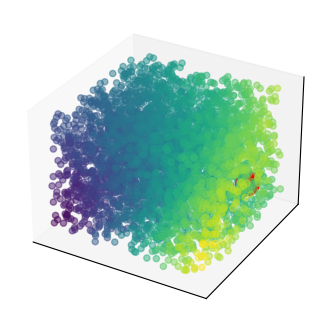

In [276]:
datapoint = 10

fig = plt.figure(figsize = (10, 4))
ax = fig.add_subplot(1, 1, 1, projection='3d')
ax.scatter(x[:,0], x[:,1], x[:,2], c=kernel_matrix[datapoint,:], alpha = 0.5)
ax.scatter(x[datapoint,0], x[datapoint,1], x[datapoint,2], alpha = 1,s = 300, c = 'red')
ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])

In [360]:
D = 3
x = np.random.uniform(0, 1, [N, D])
x = x/np.linalg.norm(x, axis = 1)[:,None]

In [361]:
# 
K = D*200
S = 0.1
S_J = 0.15
connectivity_scheme = 1
Z_connectivity_prob = 0.5
Grouped_connectivity = 0.9 # If connected to one prob of connected to other


J = np.abs(np.random.multivariate_normal(np.zeros(D), np.eye(D), size = K).T)

if connectivity_scheme == 0:
    sparsity_mask = np.random.uniform(0, 1, J.shape) < S_J
elif connectivity_scheme == 1:
    sparsity_mask_xy = np.random.uniform(0, 1, [2,K]) < S_J
    sparsity_mask_z = np.random.uniform(0, 1, [1,K]) < Z_connectivity_prob
    sparsity_mask = np.vstack([sparsity_mask_xy, sparsity_mask_z])
elif connectivity_scheme == 2:
    sparsity_mask_yz = np.random.uniform(0, 1, [2,K]) < S_J
    y_connections = np.where(sparsity_mask_yz[0,:])[0]
    num_y_connections = len(y_connections)
    group_xy_connections = np.random.uniform(0, 1, [num_y_connections]) < Grouped_connectivity
    sparsity_mask_x = np.zeros([K])
    sparsity_mask_x[y_connections[group_xy_connections]] = True
    sparsity_mask_x += np.random.uniform(0, 1, [K]) < S_J*(1-Grouped_connectivity)
    sparsity_mask = np.vstack([sparsity_mask_x, sparsity_mask_yz])
    sparsity_mask[sparsity_mask > 1] = 1

J = np.multiply(J, sparsity_mask)

y = phi(x, S, J)

# Calculate kernel matrix and its eigs
kernel_matrix = np.matmul(y, np.transpose(y))/N
#w, v = np.linalg.eig(kernel_matrix)

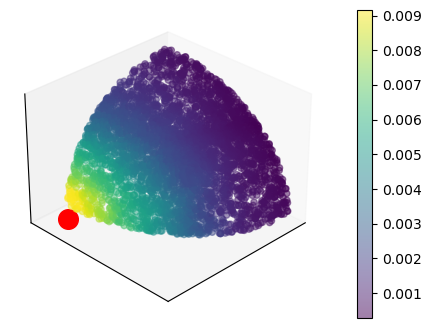

In [366]:
datapoint = 3

fig = plt.figure(figsize = (10, 4))
ax = fig.add_subplot(1, 1, 1, projection='3d')
plot = ax.scatter(x[:,0], x[:,1], x[:,2], c=kernel_matrix[:, datapoint], alpha = 0.5, zorder = 0)
ax.scatter(1.2*x[datapoint,0], 1.2*x[datapoint,1], 1.2*x[datapoint,2], alpha = 1,s = 200, zorder = 1, c = 'red')
ax.set_xticks([])
ax.set_yticks([])
ax.set_zticks([])
ax.view_init(elev=30, azim=45)
fig.colorbar(plot)


(4000, 4000)